# Dall-E 3 with Azure Open AI (Text to Image)

DALL-E 3 is the latest image generation model from OpenAI. It features enhanced image quality, more complex scenes, and improved performance when rendering text in images. It also comes with more aspect ratio options. DALL-E 3 is available through OpenAI Studio and through the REST API.

In [1]:
import openai

In [40]:
def check_openai_version():
    """
    Check Azure Open AI version
    """
    installed_version = openai.__version__

    try:
        version_number = float(installed_version[:3])
    except ValueError:
        print("Invalid OpenAI version format")
        return

    print(f"Installed OpenAI version: {installed_version}")

    if version_number < 1.0:
        print("You should upgrade OpenAI to have version >= 1.0")
        print("To upgrade, run: %pip install openai --upgrade")
    else:
        print(f"OpenAI version: {installed_version} is >= 1.0 : OK")


check_openai_version()

Installed OpenAI version: 1.3.5
OpenAI version: 1.3.5 is >= 1.0 : OK


In [27]:
import datetime
import glob
import json
import os
import requests
import sys
import time

from dotenv import load_dotenv
from openai import AzureOpenAI
from matplotlib import pyplot as plt
from PIL import Image

In [4]:
load_dotenv("azure.env")

# Azure Open AI
openai.api_type: str = "azure"
api_key = os.getenv("OPENAI_API_KEY")
api_base = os.getenv("OPENAI_API_BASE")
api_version = "2023-12-01-preview"
print("Open AI version:", openai.__version__)

Open AI version: 1.3.5


In [7]:
sys.version

'3.10.10 (main, Mar 21 2023, 18:45:11) [GCC 11.2.0]'

In [8]:
print(f"Today is {datetime.datetime.today().strftime('%d-%b-%Y %H:%M:%S')}")

Today is 28-Nov-2023 10:36:33


## Directory to save the generated images

In [9]:
images_dir = "images"

os.makedirs(images_dir, exist_ok=True)

## Function

In [10]:
client = AzureOpenAI(
    api_version=api_version,
    azure_endpoint=api_base,
    api_key=api_key,
)

In [11]:
def dalle3(prompt, size="1792x1024", quality="hd", style="vivid"):
    """
    Dall e3 image
    """
    result = client.images.generate(
        model="dalle3",  # Name of the Dall e3 deployed model
        prompt=prompt,  # Prompt
        n=1,  # Number of images
        size=size,  # 1792x1024 or 1024x1024 or 1024x1792
        quality=quality,  # hd or standard
        style=style,  # natural or vivid
    )
    # Loading the json results
    results = json.loads(result.model_dump_json())
    # Getting the url image (the first one)
    dalleimage = requests.get(results["data"][0]["url"]).content
    # Saving the image as a local file
    dt = str(datetime.datetime.today().strftime("%d%b%Y_%H%M%S").lower())
    image_file = os.path.join(
        images_dir, prompt[:50].replace(",", " ") + "_" + dt + ".png"
    )

    with open(image_file, "wb") as imagefile:
        imagefile.write(dalleimage)

    print(f"\nImage saved: {image_file}")

    # Return the image as a PIL image file
    img = Image.open(image_file)

    return img

## Dall-E3 examples

Un flacon de parfum en métal avec des motifs de fleurs, avec des pétales de roses sur un plateau en acier

Image saved: images/Un flacon de parfum en métal avec des motifs de fl_28nov2023_103657.png


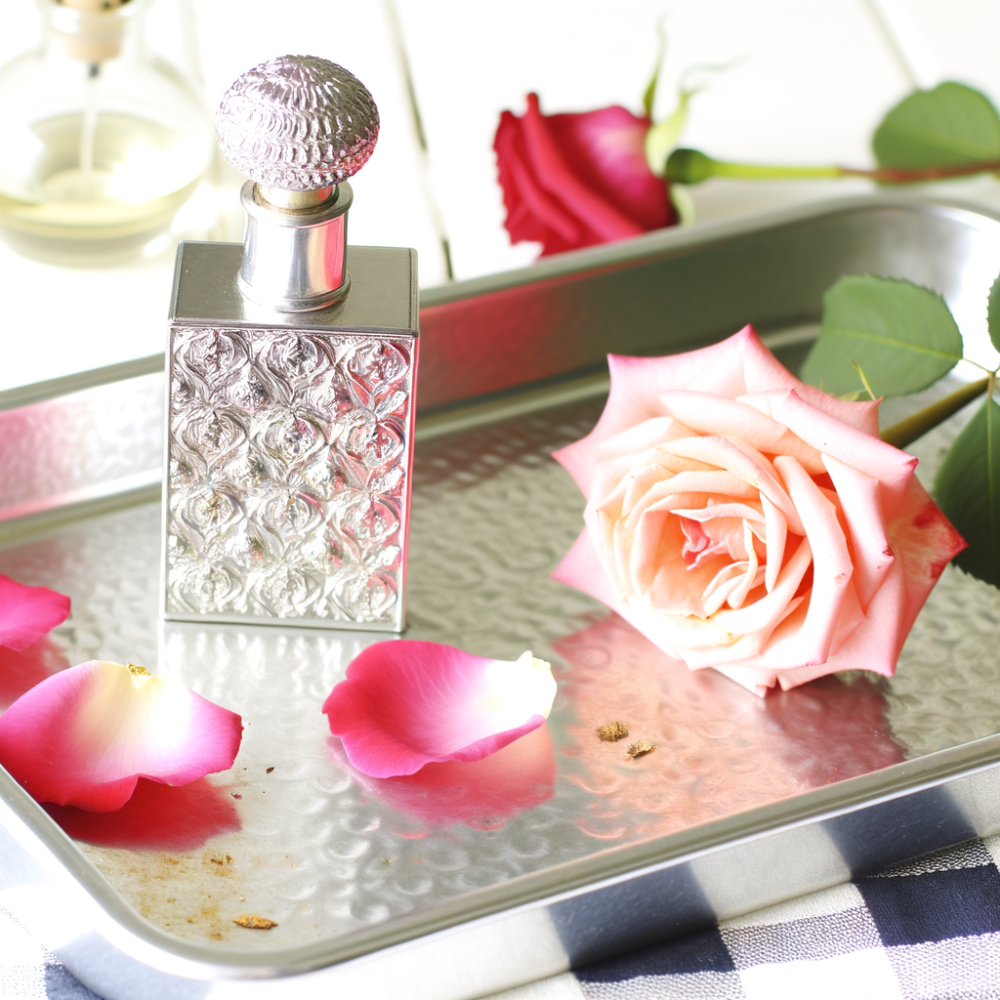

Elapsed time: 00:00:15.654517


In [12]:
start = time.time()

prompt = "Un flacon de parfum en métal avec des motifs de fleurs, avec des pétales de roses \
sur un plateau en acier"
print(prompt)

img = dalle3(prompt, size="1024x1024", quality="hd", style="natural")
elapsed = time.time() - start
display(img)

print("Elapsed time: " + time.strftime("%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

A teenage girl of afghani descent with striking rainbow eyes stares at the camera with a deep purple head scarf, Kodachrome film

Image saved: images/A teenage girl of afghani descent with striking ra_28nov2023_103830.png


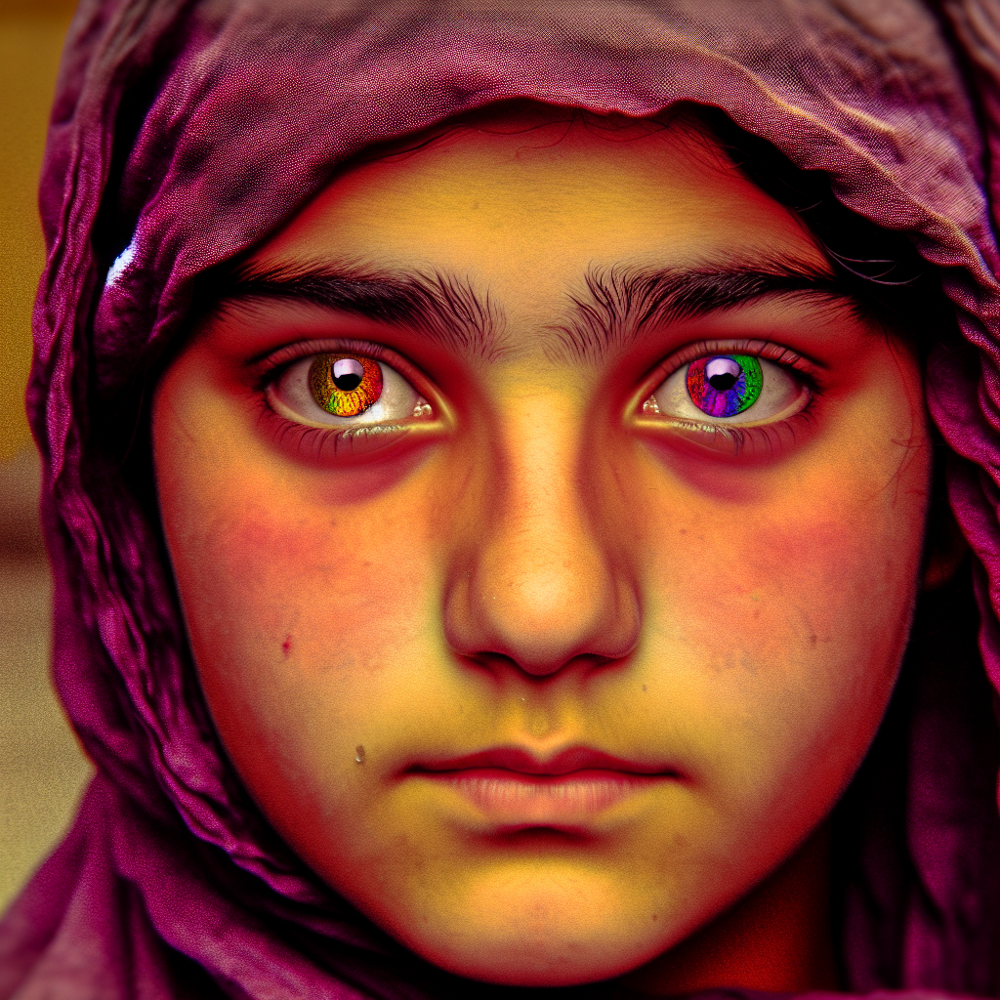

Elapsed time: 00:00:13.119485


In [13]:
start = time.time()

prompt = "A teenage girl of afghani descent with striking rainbow eyes stares \
at the camera with a deep purple head scarf, Kodachrome film"
print(prompt)

img = dalle3(prompt, size="1024x1024", quality="standard", style="natural")
elapsed = time.time() - start
display(img)

print("Elapsed time: " + time.strftime("%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

Delicious ice cream in a half sphere waffle with berries and toppings

Image saved: images/Delicious ice cream in a half sphere waffle with b_28nov2023_103902.png


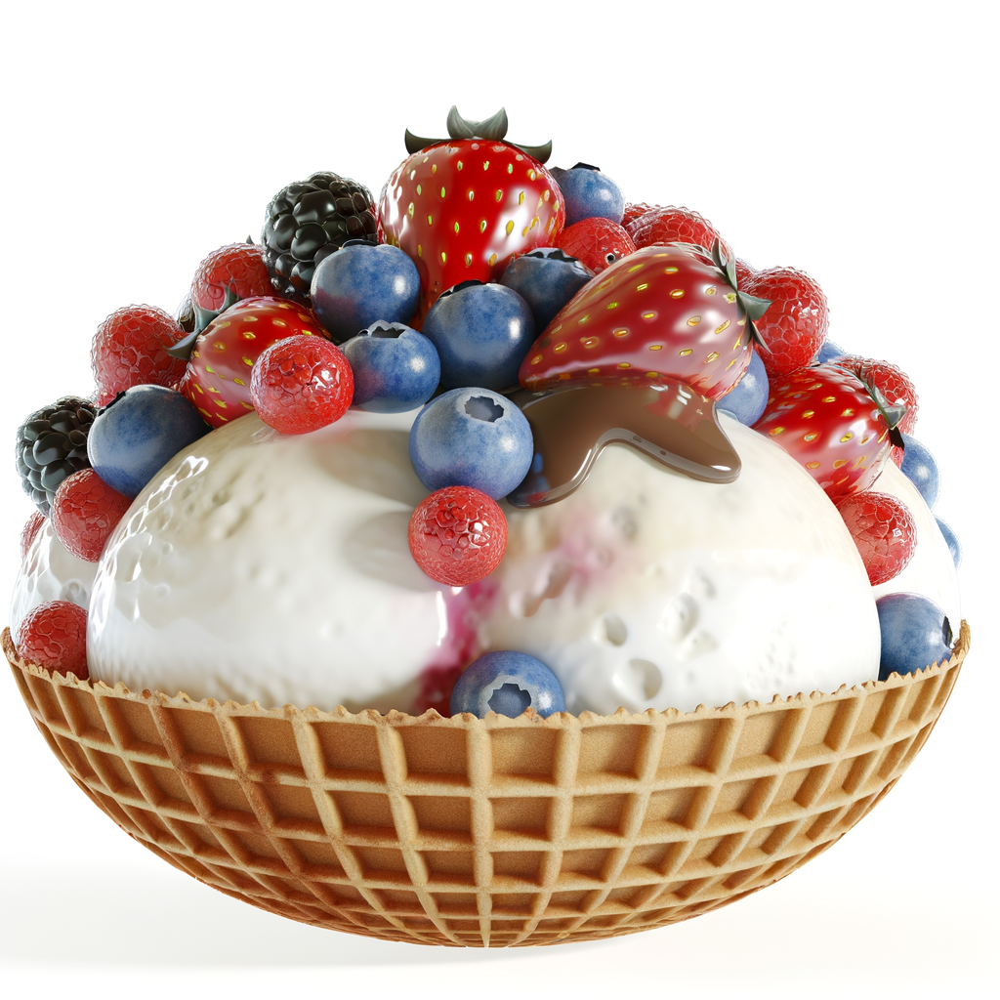

Elapsed time: 00:00:31.543341


In [14]:
start = time.time()

prompt = "Delicious ice cream in a half sphere waffle with berries and toppings"
print(prompt)

img = dalle3(prompt, size="1024x1024", quality="hd", style="natural")
elapsed = time.time() - start
display(img)

print("Elapsed time: " + time.strftime("%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

A drummer playing drums on a stage, cartoon style, black and white

Image saved: images/A drummer playing drums on a stage  cartoon style _28nov2023_105229.png


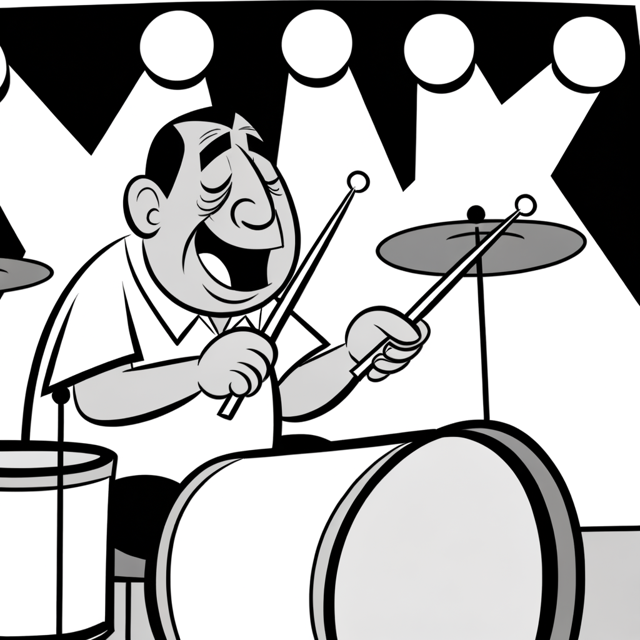

Elapsed time: 00:00:16.548723


In [51]:
start = time.time()

prompt = "A drummer playing drums on a stage, cartoon style, black and white"
print(prompt)

img = dalle3(prompt, size="1024x1024", quality="hd", style="natural")
elapsed = time.time() - start
display(img.resize((640, 640)))

print("Elapsed time: " + time.strftime("%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

A New York city busy street with people and cars

Image saved: images/A New York city busy street with people and cars_28nov2023_103943.png


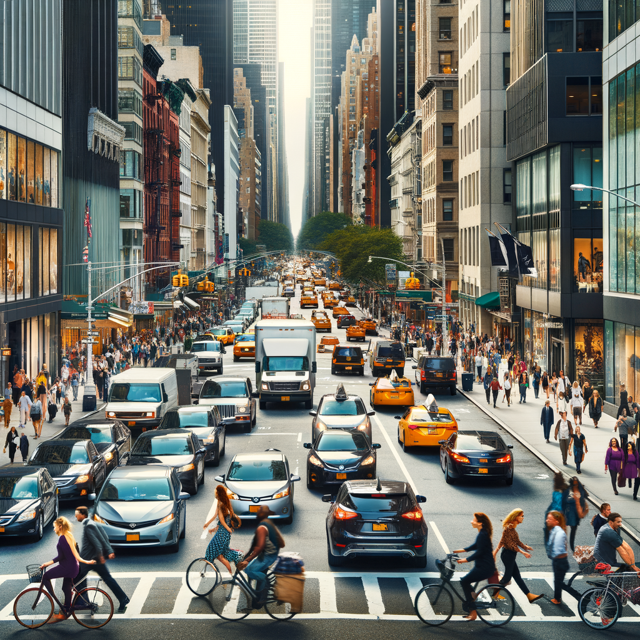

Elapsed time: 00:00:22.685519


In [16]:
start = time.time()

prompt = "A New York city busy street with people and cars"
print(prompt)

img = dalle3(prompt, size="1024x1024", quality="hd", style="vivid")
elapsed = time.time() - start
display(img.resize((640, 640)))

print("Elapsed time: " + time.strftime("%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

A tech YouTuber wearing a black cap with « AI » written on it in white. He is filming a vlog on a sunny beach. Polaroid style.

Image saved: images/A tech YouTuber wearing a black cap with « AI » wr_28nov2023_105131.png


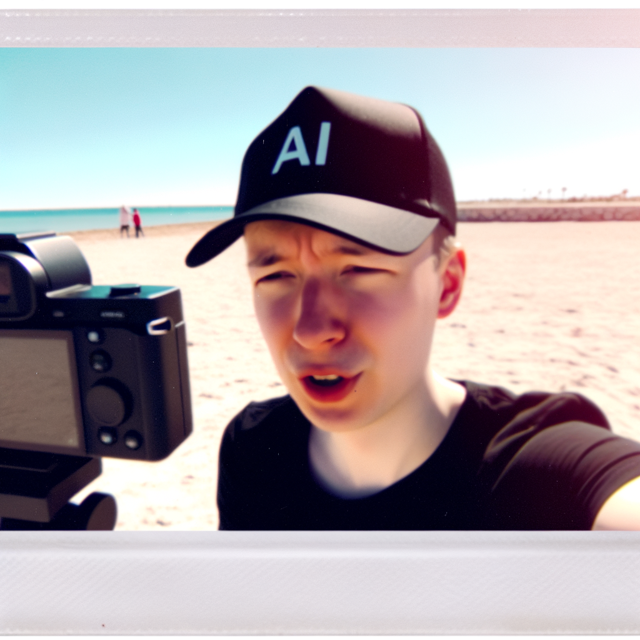

Elapsed time: 00:00:16.043905


In [48]:
start = time.time()

prompt = "A tech YouTuber wearing a black cap with « AI » written on it in white. \
He is filming a vlog on a sunny beach. Polaroid style."
print(prompt)

img = dalle3(prompt, size="1024x1024", quality="hd", style="natural")
elapsed = time.time() - start
display(img.resize((640, 640)))

print("Elapsed time: " + time.strftime("%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

Paris and the Seine river, watercolor, sunny day

Image saved: images/Paris and the Seine river  watercolor  sunny day_28nov2023_104040.png


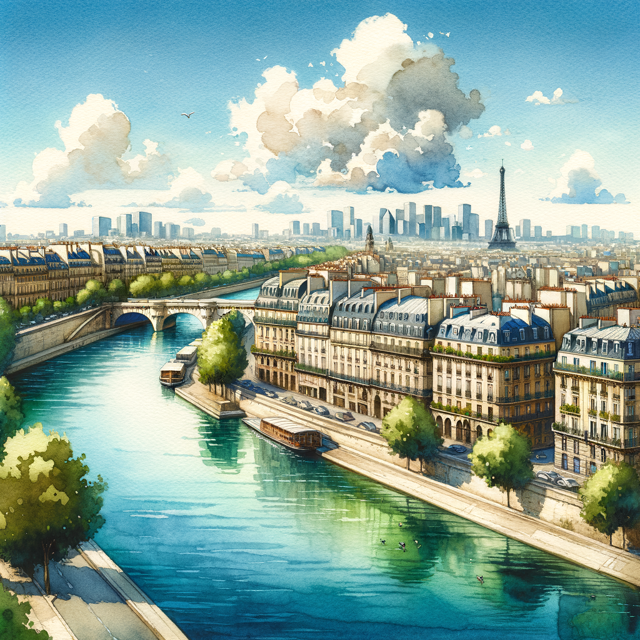

Elapsed time: 00:00:20.026210


In [19]:
start = time.time()

prompt = "Paris and the Seine river, watercolor, sunny day"
print(prompt)

img = dalle3(prompt, size="1024x1024", quality="hd", style="vivid")
elapsed = time.time() - start
display(img.resize((640, 640)))

print("Elapsed time: " + time.strftime("%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

Professional photoshoot of a Chemex brewer in the process of brewing coffee.

Image saved: images/Professional photoshoot of a Chemex brewer in the _28nov2023_104115.png


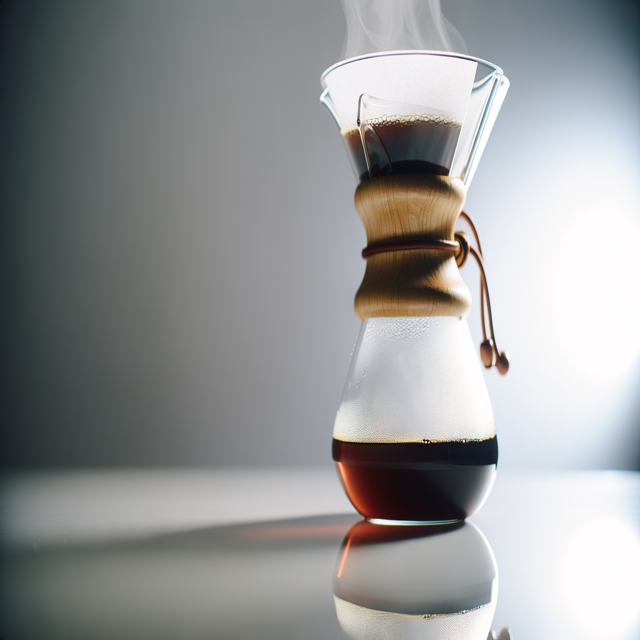

Elapsed time: 00:00:34.545856


In [20]:
start = time.time()

prompt = "Professional photoshoot of a Chemex brewer in the process of brewing coffee."
print(prompt)

img = dalle3(prompt, size="1792x1024", quality="hd", style="natural")
elapsed = time.time() - start
display(img.resize((640, 640)))

print("Elapsed time: " + time.strftime("%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

A man wearing a top hat and smoking a pipe sitting beside a window in a cafeteria while it rains outside in the style of Renoir, realist painting

Image saved: images/A man wearing a top hat and smoking a pipe sitting_28nov2023_104712.png


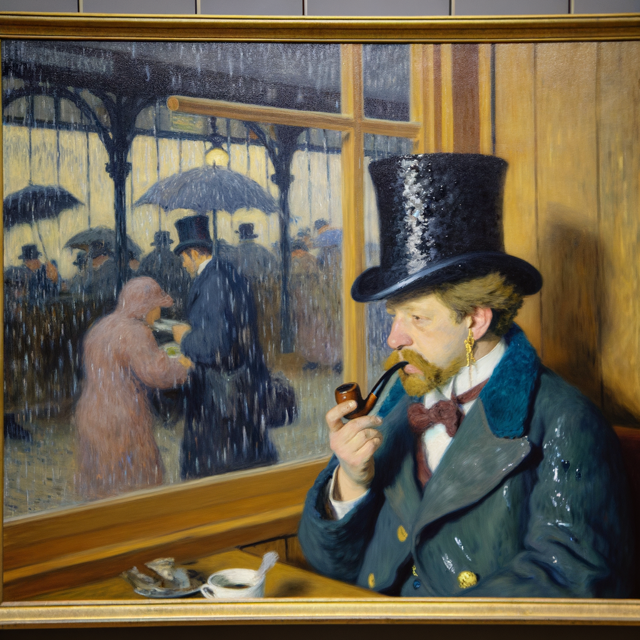

Elapsed time: 00:00:18.606424


In [43]:
start = time.time()

prompt = "A man wearing a top hat and smoking a pipe sitting beside a window \
in a cafeteria while it rains outside in the style of Renoir, realist painting"
print(prompt)

img = dalle3(prompt, size="1024x1024", quality="hd", style="natural")
elapsed = time.time() - start
display(img.resize((640, 640)))

print("Elapsed time: " + time.strftime("%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

Beautiful Na'vi under water, avatar, photorealistic, James Cameron, insane details

Image saved: images/Beautiful Na'vi under water  avatar  photorealisti_28nov2023_104157.png


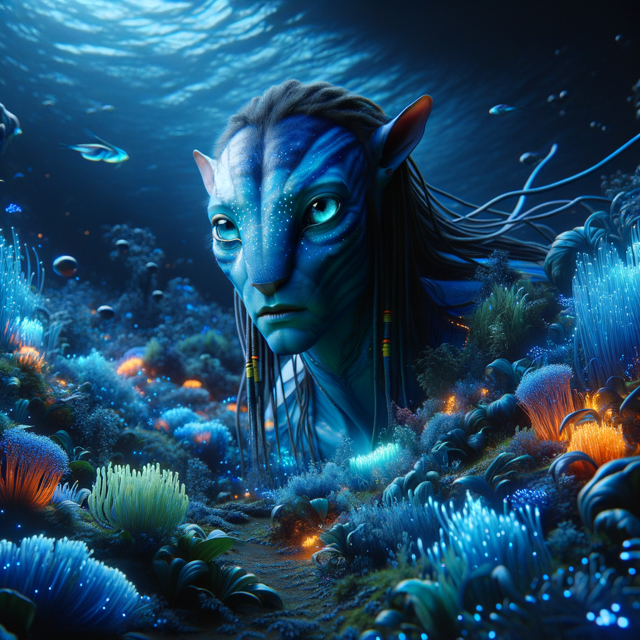

Elapsed time: 00:00:22.722394


In [22]:
start = time.time()

prompt = (
    "Beautiful Na'vi under water, avatar, photorealistic, James Cameron, insane details"
)
print(prompt)

img = dalle3(prompt, size="1024x1024", quality="hd", style="vivid")
elapsed = time.time() - start
display(img.resize((640, 640)))

print("Elapsed time: " + time.strftime("%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

Children playing in the street, realistic, in the style of Edward Hopper

Image saved: images/Children playing in the street  realistic  in the _28nov2023_104213.png


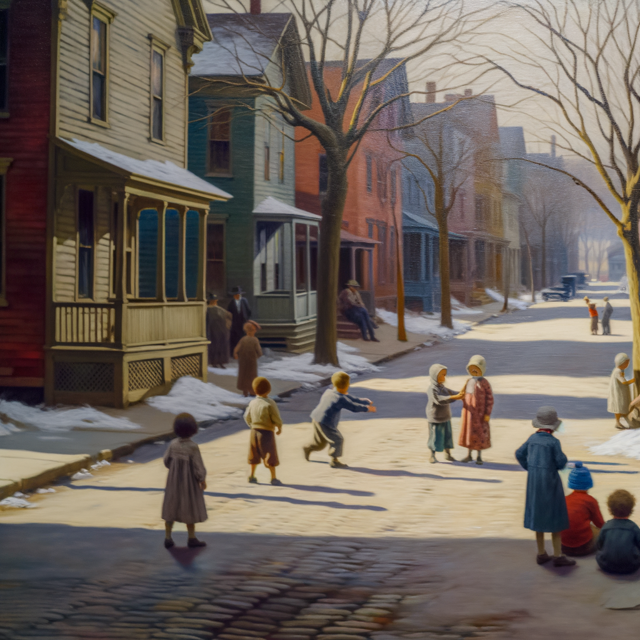

Elapsed time: 00:00:16.138683


In [23]:
start = time.time()

prompt = "Children playing in the street, realistic, in the style of Edward Hopper"
print(prompt)

img = dalle3(prompt, size="1024x1024", quality="hd", style="natural")
elapsed = time.time() - start
display(img.resize((640, 640)))

print("Elapsed time: " + time.strftime("%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

Children playing in the street in the style of Andy Warhol

Image saved: images/Children playing in the street in the style of And_28nov2023_104235.png


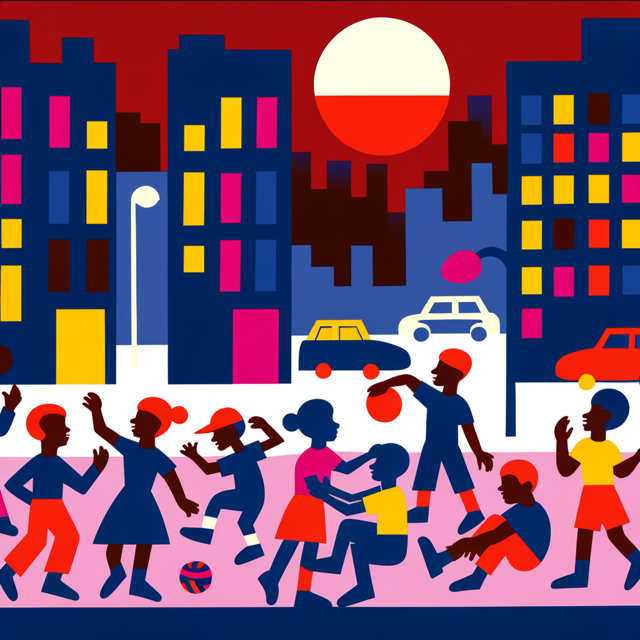

Elapsed time: 00:00:21.628940


In [24]:
start = time.time()

prompt = "Children playing in the street in the style of Andy Warhol"
print(prompt)

img = dalle3(prompt, size="1024x1024", quality="hd", style="natural")
elapsed = time.time() - start
display(img.resize((640, 640)))

print("Elapsed time: " + time.strftime("%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

Early morning photography of a landscape shrouded in mist, with diffused light and long shadows.

Image saved: images/Early morning photography of a landscape shrouded _28nov2023_104302.png


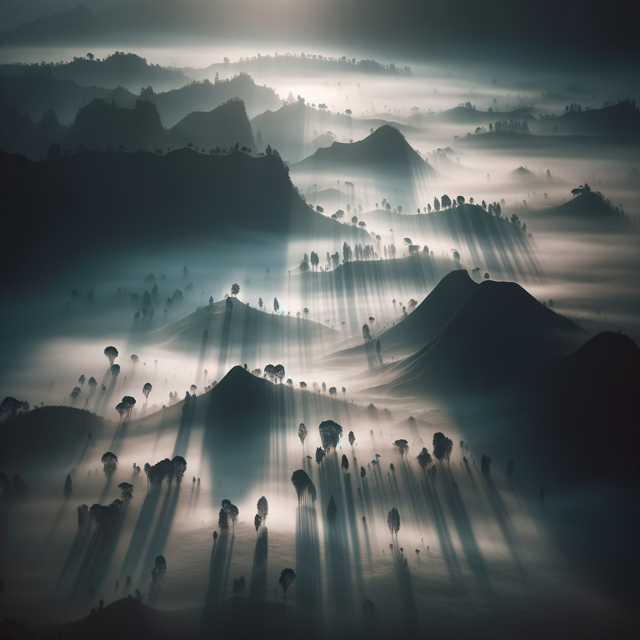

Elapsed time: 00:00:26.325666


In [25]:
start = time.time()

prompt = "Early morning photography of a landscape shrouded in mist, with diffused light and long shadows."
print(prompt)

img = dalle3(prompt, size="1792x1024", quality="hd", style="vivid")
elapsed = time.time() - start
display(img.resize((640, 640)))

print("Elapsed time: " + time.strftime("%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

Landscape photography of snow-covered mountain peaks at sunrise, using natural light.

Image saved: images/Landscape photography of snow-covered mountain pea_28nov2023_104330.png


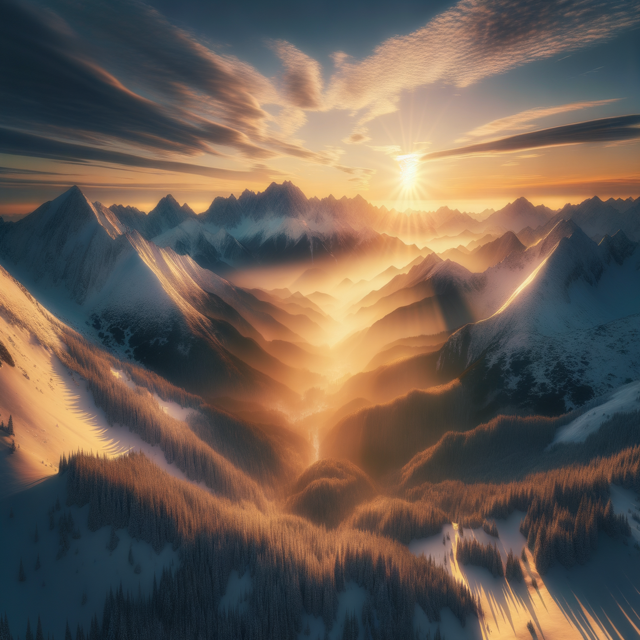

Elapsed time: 00:00:28.040511


In [26]:
start = time.time()

prompt = "Landscape photography of snow-covered mountain peaks at sunrise, using natural light."
print(prompt)

img = dalle3(prompt, size="1792x1024", quality="hd", style="vivid")
elapsed = time.time() - start
display(img.resize((640, 640)))

print("Elapsed time: " + time.strftime("%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

In [55]:
def multiple_images(images_list, num_cols=3):
    """
    Display multiple images
    """
    num_rows = int(len(images_list) / num_cols) + 1
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, 12))

    for idx, ax in enumerate(axes.flat):
        if idx < len(images_list):
            image = plt.imread(images_list[idx])
            ax.imshow(image)
            ax.axis('off')

        else:
            ax.axis('off')

    plt.tight_layout()
    plt.show()

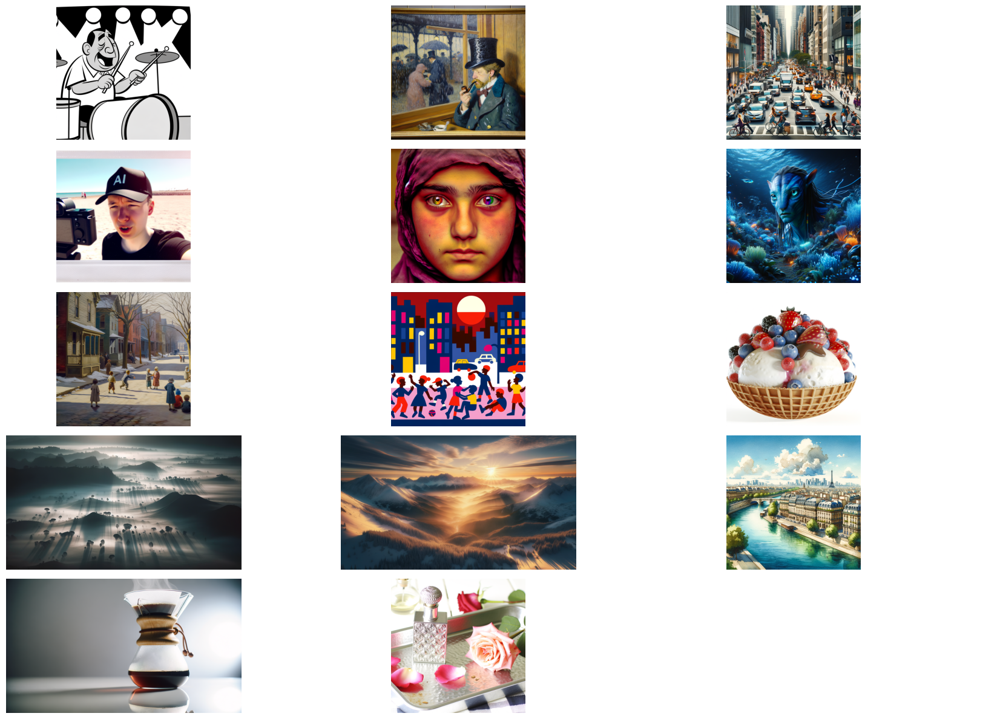

In [56]:
multiple_images(glob.glob(os.path.join(images_dir, "*.png")))